# Import libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy import stats
from scipy.stats import norm
from scipy.stats import expon
import scipy.optimize as opt
import os
import glob
import pandas as pd
from datetime import datetime, timedelta
plt.rcParams.update({'font.size': 16})
import warnings
warnings.filterwarnings("ignore")

# Define functions

In [2]:
def UniqueVals(stims, responses):
    
    """
    Takes stimulus values and responses and calculates N (total number of trials) and K (number of responses of interest) 
    for each unique stimulus values
    
    Inputs:
    stims = vector of all stimuli
    responses = vector of all responses
    
    Outputs:
    unique_stims = vector of the unrepeated stimulus locations
    Nstims = the number of times each unique stim was visited (vector)
    Kleft = the number of times the response was left at each stim location
    """
    
    unique_stims, stim_idx = np.unique(stims, return_index=True)
    Nstims, Kleft = [], []
    for u in unique_stims:
        stim_idx = np.argwhere(u==stims)
        Nstims = np.append(Nstims,len(stim_idx))
        Kleft = np.append(Kleft, np.sum(responses[stim_idx]))
        
    return unique_stims, Nstims, Kleft

In [3]:
def nloglik(params,X,N,K):
    '''
    This function returns the negative log likelihood of the parameters mu and sigma 
    for a data set
    
    Inputs:
    params = parameter values, in this case, an array of size 2 with parameters alpha and beta
    X = stimuli (vector)
    N = number of trials at each X 
    K = Number of trials with the response of interest
    
    Outputs:
    nll = the negative log likelihood 
    '''   
    
    alpha=params[0]
    beta=params[1]
    
    psi = norm.cdf(X,alpha,beta)       
    ll = np.sum(K * np.log(psi) + ((N - K) * np.log(1-psi)))

    nll = -ll
    
    return nll

In [4]:
def psiBIC(params, data):
    """
    Definition: calculates the bayesian information criteria (BIC) for a psychometric function 
    
    Inputs:
    params = vector of the parameters for the psychometric function (alpha, beta), in this case, it only takes two arguments
    data = a list of size 3 containing 
        1) N = the number of trials at each stimulus location
        2) K = the number of 'left' responses at each stimulus location
        3) x = the stimulus locations
    
    Outputs:
    BIC
    """   
    #Organize the data
    alpha = params[0]
    beta = params[1]
    N = data[0]
    K = data[1]
    x = data[2]
    
    #Calcualte the log likelihood    
    psi = norm.cdf(x,alpha,beta)
    ll = np.nansum(K * np.log(psi) + ((N - K) * np.log(1-psi)))
    
    #Calculate BIC
    BIC = -2 * ll + np.log(len(N)) * len(params)
    
    return BIC

In [5]:
def psiAIC(params, data):
    """
    Definition: calculates the Akaike information criteria (AIC) for a psychometric function 
    
    Inputs:
    params = vector of the parameters for the psychometric function (alpha, beta), in this case, it only takes two arguments
    data = a list of size 3 containing 
        1) N = the number of trials at each stimulus location
        2) K = the number of 'left' responses at each stimulus location
        3) x = the stimulus locations
    
    Outputs:
    AIC
    """   
    
    #Organize the data
    alpha = params[0]
    beta = params[1]
    N = data[0]
    K = data[1]
    x = data[2]
    
    #Calcualte the log likelihood    
    psi = norm.cdf(x,alpha,beta)
    ll = np.nansum(K * np.log(psi) + ((N - K) * np.log(1-psi)))

    #Calculate AIC
    AIC = 2*len(params) - 2*ll
    
    return AIC

In [6]:
def Fit_psi(stims, responses, Num_Inits):
    """
    Definition: Uses MLE to fit a psychometric function (normcdf) to data
    
    Inputs:
    stims = vector of all stimulus values 
    responses = vector of all responses
    Num_Inits = number of initializations
    
    Outputs:
    best_params = best paramers (size 2 vector)
    best_ll = log likelihood of the best parameters
    """   
    
    #Calculate unique values of the stims
    unique_stims, Nstims, Kleft = UniqueVals(stims, responses)

    temp_ll = []
    temp_params = np.empty((Num_Inits,2))
    for i in range(Num_Inits):
        # x0 = [np.random.randint(-30, 30), np.random.randint(0, 30)]
        x0 = [norm.rvs(0,20), expon.rvs(0,20)]
        
        res = opt.minimize(nloglik, x0=x0, args=(unique_stims,Nstims,Kleft),
                method='Nelder-Mead', bounds=((-50,50),(0,50)), options={'disp': False})
        
        temp_ll = np.append(temp_ll, res.fun)
        temp_params[i,:] = res.x

    min_idx = np.nanargmin(temp_ll)
    best_params = temp_params[min_idx]
    best_ll = temp_ll[min_idx]
    
    return best_params, best_ll

In [7]:
def MLE_each_trial(All_stims, All_responses):
    """
    Definition: Finds the max likelihood for each trial 
    
    inputs:
    stims = vector of all stimulus values 
    responses = vector of all responses
    
    outputs:
    MLE_alpha = vector of the max likelihood estimate for alpha on each trial
    MLE_beta = vector of the max likelihood estimate for beta on each trial 
    """
    
    #Set the alpha and beta ranges
    a_range = np.linspace(-100,100,201)
    b_range = np.linspace(0.001,100,201)
    
    MLE_alpha, MLE_beta, stims, responses = [], [], [], []
    #Loop through each trial
    for i in range(len(All_stims)):
        
        #Record the stim and response
        stims = np.append(stims, All_stims[i])
        responses = np.append(responses, All_responses[i])
        
        #Account for repeated stimuli 
        Unique_stims, Nstims, Kleft = UniqueVals(stims, responses)
        
        #Calcualte the likelihood for the response given the current parameters
        Likelihood = np.empty((len(b_range),len(a_range)))
        for a_idx, a in enumerate(a_range):
            for b_idx, b in enumerate(b_range):
                psi = norm.cdf(Unique_stims,a,b)
                Likelihood[b_idx,a_idx] = np.prod((psi**Kleft) * ((1-psi)**(Nstims-Kleft)))

        #Index the max likelihood for each
        lik_max_idx = np.unravel_index(Likelihood.argmax(), Likelihood.shape)
        MLE_alpha = np.append(MLE_alpha, a_range[lik_max_idx[1]])
        MLE_beta = np.append(MLE_beta, b_range[lik_max_idx[0]])

    return MLE_alpha, MLE_beta

In [8]:
#Look up table
def Psi_lookT(X,a_range,b_range):
    """
    Definiton: This function creates two lookup tables required for the psi algorithm to run more efficiently
    It is a table of probabilities for both responses (left and right in this case) given all possible
    alpha and beta values and all possible stimulus locations:
    p(r='left'|alpha,beta,X)
    p(r='right'|alpha,beta,X)
    
    Inputs:
    X = vector of all stimulus values 
    a_range = vector of all possible alpha values
    b_range = vector of all possible beta values (a_range and b_range must be the same size)
    
    Outputs:
    p_left_look = look up table for left (size = len(b_range), len(a_range), len(X))
    p_right_look =  look up table for right (size = len(b_range), len(a_range), len(X))
    """
        
    #Preallocate the lookup tables
    p_left_look = np.empty([len(b_range),len(a_range),(len(X))])
    p_right_look = np.empty([len(b_range),len(a_range),(len(X))])
    
    #Loop through all possible stimulus, alpha and beta values
    for x_i, x in enumerate(X):
        for a_i, a in enumerate(a_range):
            for b_i, b in enumerate(b_range):
                psi = norm.cdf(x,a,b)
                p_left_look[b_i,a_i,x_i] = psi
                p_right_look[b_i,a_i,x_i] = 1-psi

    return p_left_look, p_right_look

In [9]:
#Entropy
def CalcH(X, p_left_look, p_right_look, Prior):
    """
    Definition: Calculates the expected entropy (EH) of each possible stimulus value to determine which one minimizes,
    the entropy for the next trial. This is the stimulus that will provide the most information for both parameters
    
    Inputs:
    X = vector of all stimulus values 
    p_left_look = look up table for left (size = len(b_range), len(a_range), len(X))
    p_right_look =  look up table for right (size = len(b_range), len(a_range), len(X))
    Prior = 2d prior for the parameter estiamtes (alpha and beta)
    
    Outputs:
    EH = the expected entropy function, a vector of expected entropy values for each stimulus position (X)
    best_X = the best stimulus position, the one that minimizes entropy
    """
    
    #Simulate through each possible stim value, X
    EH = []
    for i, x in enumerate(X):

        #Calculate the probability of getting a response, r, after presenting test x at the next trial (across all possible parameter values)
        p_left = np.nansum(np.nansum(np.multiply(p_left_look[:,:,i],Prior)))
        p_right = np.nansum(np.nansum(np.multiply(p_right_look[:,:,i],Prior)))

        #Calculate the posterior for each response 
        Post_left = p_left_look[:,:,i]*Prior
        Post_left = Post_left / p_left
        Post_right = p_right_look[:,:,i]*Prior
        Post_right = Post_right / p_right

        #Estimate the entropy of the posterior distribution for each response
        H_left = -np.nansum(np.nansum(Post_left * np.log2(Post_left)))
        H_right = -np.nansum(np.nansum(Post_right * np.log2(Post_right)))
        
        #Combine the entropy calculations, weighted by their probabilities
        Total_H = (H_left*p_left) + (H_right*p_right)
        EH = np.append(EH, Total_H)
        
    best_X = X[np.argmin(EH)]
    return EH, best_X

In [10]:
def sim_psi(params, Ntrials, X, a_range, b_range, p_left_look, p_right_look, Prior):
    """
    Definition: Simulates the Psi method using the given parameters
    
    Inputs:
    params = vector of the parameters for the psychometric function (alpha, beta), in this case, it only takes two arguments
    Ntrials = number of trials to simulate
    X = vector of all stimulus values 
    a_range = vector of all possible alpha values
    b_range = vector of all possible beta values (a_range and b_range must be the same size)    
    p_left_look = look up table for left (size = len(b_range), len(a_range), len(X))
    p_right_look =  look up table for right (size = len(b_range), len(a_range), len(X))
    Prior = 2d prior for the parameter estiamtes (alpha and beta)
    
    Outputs:
    stims = vector of length Ntrials of all stimulus positions 
    responses = vector of length Ntrials of all simulated responses 
    alpha_EV = vector of length Ntrials of the alpha estimates after each trial
    beta_EV = vector of length Ntrials of the beta estimates after each trial
    """
    
    alpha = params[0]
    beta = params[1]
    
    stims, responses, alpha_EV, beta_EV = [], [], [], []
    for i in range(Ntrials):
        
        #Calculate the best stim position
        _, best_X = CalcH(X, p_left_look, p_right_look, Prior)
        stims = np.append(stims, best_X)
        
        #Simualte a response based on the parameters
        responses = np.append(responses, norm.cdf(best_X, alpha, beta) > np.random.rand())
        
        #Account for repeated stimuli 
        Unique_stims, Nstims, Kleft = UniqueVals(stims, responses)

        #Calcualte the likelihood for the response given the current parameters
        Likelihood = np.empty((len(b_range),len(a_range)))
        for a_idx, a in enumerate(a_range):
            for b_idx, b in enumerate(b_range):
                psi = norm.cdf(Unique_stims,a,b)
                Likelihood[b_idx,a_idx] = np.prod((psi**Kleft) * ((1-psi)**(Nstims-Kleft)))

        #Calculate the posterior
        Posterior = Likelihood*Prior
        Posterior = Posterior/np.nansum(np.nansum(Posterior))
        
        #Marginalize the posterior
        alpha_post = np.nansum(Posterior,axis=0)
        beta_post = np.nansum(Posterior,axis=1)

        #Calculate the expected value of each
        alpha_EV = np.append(alpha_EV, np.nansum(a_range*alpha_post))
        beta_EV = np.append(beta_EV, np.nansum(b_range*beta_post))

        #The posterior becomes the prior for the next trial
        Prior = Posterior        
        
    return stims, responses, alpha_EV, beta_EV

In [11]:
def ConfirmStimChoice(test, plt_entropy):
    """
    Definition: Probes each trial of the psi method with a focus on both simulus selection and parameter estimation. 
    returns a plot of the simulated posteriors used to caluclate entropy (if desired) and the likelihood and 
    posterior after each trial. 
    
    Inputs:
    test = a data frame for a single subject
    plt_entropy = boolean of whether or not to plot the simulated posteriors used to caluclate entropy
    
    Outputs:
    no variable, returns the plots described above
    """
       
    #Index the participant info
    SID = test.SID[0] + test.Test[0]
    BslDiff = round(test.BslDiff.values[0])    
    a_est = test.Alpha_EV.values + BslDiff
    b_est = test.Beta_EV.values
    Responses = test.BinaryResponses.values
    Stims = test.AllStims.values + BslDiff
    response_str = test.AllResponses.values
    trials = test.Trial_num.values
    selected_stims = test.SelectedStims.values
   
    X = np.arange(-100,110,10)
    a_range = np.linspace(-100,100,201) 
    b_range = np.linspace(0.001,100,201)
    p_left_look, p_right_look = Psi_lookT(X, a_range, b_range)

    #Set the priors
    p_alpha = norm.pdf(a_range,0, 20)
    p_beta = expon.pdf(b_range,0,20)
    p_alpha = np.reshape(p_alpha,(1,len(p_alpha)))
    p_beta = np.reshape(p_beta,(1,len(p_beta)))
    Prior = p_beta.T @ p_alpha
    
    fig, ax = plt.subplots(figsize=(15,7),tight_layout=True)    
    ax.plot(trials, Stims,'b',alpha=0.5)
    ax.plot(trials[(selected_stims==0) & (Responses==1)], Stims[(selected_stims==0) & (Responses==1)],'bo', markersize=7, label='Response = Left')
    ax.plot(trials[(selected_stims==0) & (Responses==0)], Stims[(selected_stims==0) & (Responses==0)],'bo',fillstyle='none', markersize=7, label='Response = Right')
    ax.plot(trials[(selected_stims==1) & (Responses==1)], Stims[(selected_stims==1) & (Responses==1)],'co', markersize=7, label='Pre-selected Stims')
    ax.plot(trials[(selected_stims==1) & (Responses==0)], Stims[(selected_stims==1) & (Responses==0)],'co',fillstyle='none', markersize=7)
    ax.plot(trials,np.zeros(len(test)),'k')
    ax.plot(trials,a_est,'b-',label='Alpha estimate')
    ax.plot(trials,b_est,'r-',label='Beta estimate')
    ax.set(xlabel='Trial Num.', xlim=(0,len(test)+1), title=SID,ylabel='Foot Difference (L-R)')
    ax.legend()    
    plt.show()
    
    All_EH, All_Post = [], []
    alpha_EV_alt, beta_EV_alt = [],[]
    BestStims, diff_idx, stims, responses, alpha_EV, beta_EV = [],[],[],[],[],[]
    for t in range(len(Responses)):

        EH, best_X = CalcH(X, p_left_look, p_right_look, Prior)
        BestStims = np.append(BestStims, best_X)
        
        #Index the best and worst stims
        worst_X = X[np.argmax(EH)]
        
        best_sim_post_L = p_left_look[:,:,np.argmin(EH)]*Prior
        best_sim_post_L = best_sim_post_L / np.nansum(np.nansum(best_sim_post_L))
        H_best_L = round(-np.nansum(np.nansum(best_sim_post_L * np.log2(best_sim_post_L))),2)
        
        best_sim_post_R = p_right_look[:,:,np.argmin(EH)]*Prior
        best_sim_post_R = best_sim_post_R / np.nansum(np.nansum(best_sim_post_R))
        H_best_R = round(-np.nansum(np.nansum(best_sim_post_R * np.log2(best_sim_post_R))),2)

        worst_sim_post_L = p_left_look[:,:,np.argmax(EH)]*Prior
        worst_sim_post_L = worst_sim_post_L / np.nansum(np.nansum(worst_sim_post_L))
        H_worst_L = round(-np.nansum(np.nansum(worst_sim_post_L * np.log2(worst_sim_post_L))),2)

        worst_sim_post_R = p_right_look[:,:,np.argmax(EH)]*Prior
        worst_sim_post_R = worst_sim_post_R / np.nansum(np.nansum(worst_sim_post_R))
        H_worst_R = round(-np.nansum(np.nansum(worst_sim_post_R * np.log2(worst_sim_post_R))),2)

        #Record the stim and response
        stims = np.append(stims, Stims[t])
        responses = np.append(responses, Responses[t])
        
        #Account for repeated stimuli 
        Unique_stims, Nstims, Kleft = UniqueVals(stims, responses)
        current_stim_idx = np.argwhere(Unique_stims==Stims[t])
        
        #Calcualte the likelihood for the response given the current parameters
        Likelihood = np.empty((len(b_range),len(a_range)))
        for a_idx, a in enumerate(a_range):
            for b_idx, b in enumerate(b_range):
                psi = norm.cdf(Unique_stims,a,b)
                Likelihood[b_idx,a_idx] = np.prod((psi**Kleft) * ((1-psi)**(Nstims-Kleft)))
        
        #Index the max likelihood for each
        lik_max_idx = np.unravel_index(Likelihood.argmax(), Likelihood.shape)
        max_lik_alpha = a_range[lik_max_idx[1]]
        max_lik_beta = b_range[lik_max_idx[0]]
        
        #Calculate the posterior
        Posterior = Likelihood*Prior                    
        Posterior = Posterior/np.nansum(np.nansum(Posterior))
        
        #Marginalize the posterior
        alpha_post = np.nansum(Posterior,axis=0)
        beta_post = np.nansum(Posterior,axis=1)
        
        #Calculate the expected value of each
        alpha_EV = np.append(alpha_EV, np.nansum(a_range*alpha_post))
        beta_EV = np.append(beta_EV, np.nansum(b_range*beta_post))
        
        #Entropy for the likelihood and posterior
        H_lik = round(-np.nansum(np.nansum(Likelihood * np.log2(Likelihood))),2)        
        H_actual = round(-np.nansum(np.nansum(Posterior * np.log2(Posterior))),2)
        
        #Current psi function estimates
        psi_est = norm.cdf(X,alpha_EV[t], beta_EV[t])
        psi_mle = norm.cdf(X,max_lik_alpha, max_lik_beta)

        #The posterior becomes the prior for the next trial
        Prior = Posterior
  
        #Plot the best and worst simulated posteriors if desired
        if plt_entropy==True:
            fig, ax = plt.subplots(2,2,figsize=(15,10),tight_layout=True)
            colormap1 = ax[0,0].imshow(best_sim_post_L,origin='lower', extent=[-100,100,0,200])
            cbar1 = plt.colorbar(colormap1, ax=ax[0,0])
            cbar1.set_label('Probability')
            ax[0,0].set(xlabel='alpha', ylabel='beta',title='Best Sim Post - Left (E=' + str(H_best_L) + ')')       

            colormap2 = ax[0,1].imshow(best_sim_post_R,origin='lower', extent=[-100,100,0,200])
            cbar2 = plt.colorbar(colormap2, ax=ax[0,1])
            cbar2.set_label('Probability')
            ax[0,1].set(xlabel='alpha', ylabel='beta',title='Best Sim Post - Right (E=' + str(H_best_R) + ')')    

            colormap3 = ax[1,0].imshow(worst_sim_post_L,origin='lower', extent=[-100,100,0,200])
            cbar3 = plt.colorbar(colormap3, ax=ax[1,0])
            cbar3.set_label('Probability')
            ax[1,0].set(xlabel='alpha', ylabel='beta',title='Worst Simulated Post (E=' + str(H_worst_L) +')')       

            colormap4 = ax[1,1].imshow(worst_sim_post_R,origin='lower', extent=[-100,100,0,200])
            cbar4 = plt.colorbar(colormap4, ax=ax[1,1])
            cbar4.set_label('Probability')
            ax[1,1].set(xlabel='alpha', ylabel='beta',title='Worst Simulated Post (E=' + str(H_worst_R) +')')    
            plt.suptitle(SID + ' (Trial ' + str(t+1) + '; Response = ' + response_str[t] + ')')
            plt.show()
        
        #Plot the entropy function
        fig, ax = plt.subplots(1,4,figsize=(25,5),tight_layout=True)
        ax[0].plot(X,EH,label='Best Stim = ' + str(best_X))
        ax[0].axvline(Stims[t],color='k',label='Actual Stim = ' + str(Stims[t]))
        ax[0].axvline(worst_X,color='r',label='Worst Stim = ' + str(worst_X))
        ax[0].set(title='Entropy', xlabel='X',ylabel='Expected Entropy')
        ax[0].legend()    
        
        #Plot current psi estimates
        ax[1].plot(X, psi_est,'b', label='psi est',alpha=0.7)
        ax[1].text(-90,0.9, 'Bayes Est.', c='b')
        ax[1].plot(X, psi_mle, 'r', label='mle est',alpha=0.7)
        ax[1].text(-90,0.8, 'MLE', c='r')        
        ax[1].plot(Unique_stims, Kleft/Nstims, 'ko', label='Responses')
        ax[1].plot(Unique_stims[current_stim_idx], Kleft[current_stim_idx]/Nstims[current_stim_idx], marker='o', ms=10, mec='k', mfc='w', label='Responses')
        ax[1].set(title='Current psi functions', xlabel='X',ylabel='p left')
        
        #Plot likelihood
        colormap5 = ax[2].imshow(Likelihood,origin='lower', extent=[-100,100,0,200])
        cbar5 = plt.colorbar(colormap5, ax=ax[2])
        cbar5.set_label('Probability')
        ax[2].text(-90, 170, r'($\alpha$=' + str(round(max_lik_alpha)) + r', $\beta$=' + str(round(max_lik_beta)) + ')', c='w')        
        ax[2].set(xlabel='alpha', ylabel='beta',title='Likelihood')
        
        #Plot posterior
        colormap6 = ax[3].imshow(Posterior,origin='lower', extent=[-100,100,0,200])
        cbar6 = plt.colorbar(colormap5, ax=ax[3])
        ax[3].text(-90, 170, r'($\alpha$=' + str(round(alpha_EV[t])) + r', $\beta$=' + str(round(beta_EV[t])) + ')', c='w')
        ax[3].set(xlabel='alpha', ylabel='beta',title='Posterior (E = ' + str(H_actual) + ')')
        plt.suptitle(SID + ' (Trial ' + str(t+1) + '; Response = ' + response_str[t] + ')')
        plt.show()

In [12]:
def check_estimates(test):
    """
    Definition: this function simulates each test to make sure the parameter estaimtes are the same 
    
    Inputs:
    test = a data frame for a single subject
    
    Outputs:
    no variable, plots the live and simulated estimates
    """
    
    SID = test.SID[0] + test.Test[0]

    BslDiff = round(test.BslDiff.values[0])
    Responses = test.BinaryResponses.values
    Stims = test.AllStims.values + BslDiff

    X = np.arange(-100,110,10)
    a_range = np.linspace(-100,100,201) 
    b_range = np.linspace(0.001,100,201)
    p_left_look, p_right_look = Psi_lookT(X, a_range, b_range)

    #Set the priors
    p_alpha = norm.pdf(a_range, 0, 20)
    p_beta = expon.pdf(b_range, 0, 20)
    p_alpha = np.reshape(p_alpha,(1,len(p_alpha)))
    p_beta = np.reshape(p_beta,(1,len(p_beta)))
    Prior = p_beta.T @ p_alpha 

    alpha_EV_sim, beta_EV_sim, stims, responses = [], [], [], []
    for t in range(len(Responses)):

        #Record the stim and response
        stims = np.append(stims, Stims[t])
        responses = np.append(responses, Responses[t])

#         #Account for repeated stimuli 
#         Unique_stims, Nstims, Kleft = UniqueVals(stims, responses)

#         #Calcualte the likelihood for the response given the current parameters
#         Likelihood = np.empty((len(b_range),len(a_range)))
#         for a_idx, a in enumerate(a_range):
#             for b_idx, b in enumerate(b_range):
#                 psi = norm.cdf(Unique_stims,a,b)
#                 Likelihood[b_idx,a_idx] = np.prod((psi**Kleft) * ((1-psi)**(Nstims-Kleft)))

        #Alt posterior calc
        stim_idx = np.argwhere(stims[t]==X)[0][0]
        if responses[t]==1:
            Posterior = p_left_look[:,:,stim_idx]*Prior
        elif responses[t]==0:
            Posterior = p_right_look[:,:,stim_idx]*Prior
        Posterior = Posterior/np.nansum(np.nansum(Posterior))
        #Marginalize the posterior
        alpha_post = np.nansum(Posterior,axis=0)
        beta_post = np.nansum(Posterior,axis=1)
        #Calculate the expected value of each
        alpha_EV_sim = np.append(alpha_EV_sim, np.nansum(a_range*alpha_post))
        beta_EV_sim = np.append(beta_EV_sim, np.nansum(b_range*beta_post))  
        
        # #Calculate the posterior
        # Posterior = Likelihood*Prior                    
        # Posterior = Posterior/np.nansum(np.nansum(Posterior))
        # #Marginalize the posterior
        # alpha_post = np.nansum(Posterior,axis=0)
        # beta_post = np.nansum(Posterior,axis=1)
        # #Calculate the expected value of each
        # alpha_EV_sim = np.append(alpha_EV_sim, np.nansum(a_range*alpha_post))
        # beta_EV_sim = np.append(beta_EV_sim, np.nansum(b_range*beta_post))  

        Prior = Posterior

    trials = test.Trial_num.values
    selected_stims = test.SelectedStims.values
    a_est = test.Alpha_EV.values + BslDiff
    b_est = test.Beta_EV.values     

    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(trials,np.zeros(len(test)),'k')
    ax.plot(trials,a_est,'b-',label='Alpha est live',alpha=0.5)
    ax.plot(trials,alpha_EV_sim,'b--',label='Alpha est sim')
    ax.plot(trials,b_est,'r-',label='Beta est live', alpha=0.5)
    ax.plot(trials,beta_EV_sim,'r--',label='Beta est sim')
    ax.set(xlabel='Trial Num.', xlim=(0,len(test)+1), title=SID,ylabel='Foot Difference (L-R)')
    plt.legend()
    plt.show()

# Load the data

In [13]:
#Change the directory
os.chdir('C:\\Users\\Jonathan\\Documents\\GitHub\\Split-Belt-AFC-Reliability\\Data\\TestRetest_PSI')

#Load the data and combine
file_names = glob.glob("*.csv")
combined_data = [pd.read_csv(i, parse_dates=['StartTime']) for i in file_names]

#Create data frame
DF = pd.concat(combined_data)

#Create groupby objects for easy indexing
grp_tests = DF.groupby(['SID','Test'])
grp_subjs = DF.groupby(['SID'])

#Print the subjects
print('Included subjects =', np.unique(DF.SID))
print('N =', len(np.unique(DF.SID)))

Included subjects = ['TRTPSI_01' 'TRTPSI_02']
N = 2


# Confirmatory Analysis

## Are start positions close to equal?

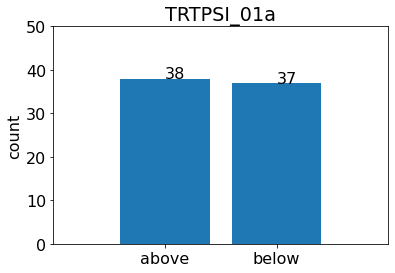

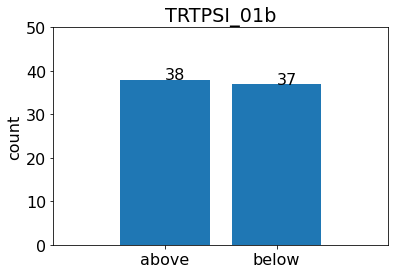

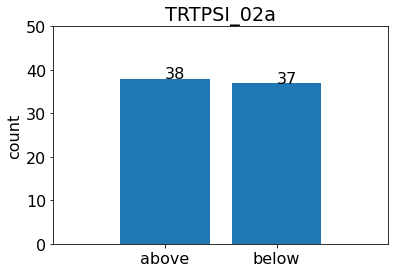

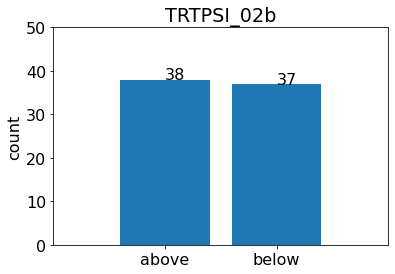

In [14]:
for name, test in grp_tests:
    
    #Calculate the percept of start positions that started above
    started_above = sum(test.AllStarts > test.AllStims)
    started_below = sum(test.AllStarts < test.AllStims)
    
    fig, ax = plt.subplots()
    ax.bar([1, 2], [started_above, started_below])
    ax.text(1,started_above,str(started_above))
    ax.text(2,started_below,str(started_below))
    ax.set(ylim=(0, 50),xlim=(0,3),xticks=[1,2], xticklabels=['above', 'below'],ylabel='count',title=name[0]+name[1])
    plt.show()


## Are the start and end speeds randomized?

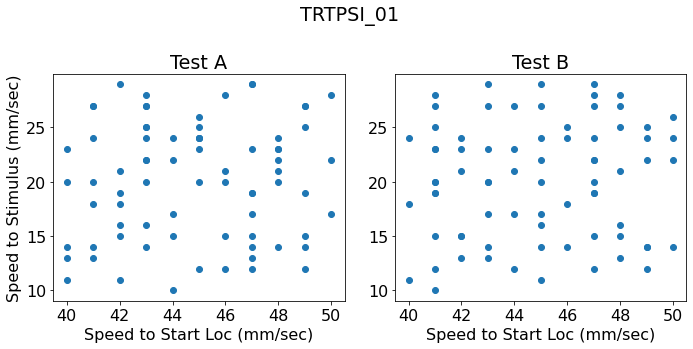

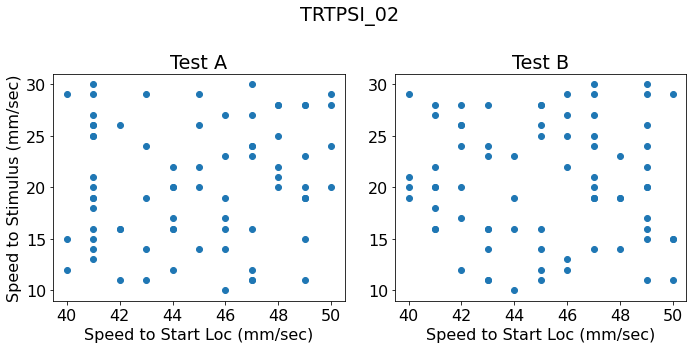

In [15]:
#Loop through all subejcts
for name, test in grp_subjs:
    
    #Index the different tests
    Test_a = test[test.Test=='a']
    Test_b = test[test.Test=='b']
    
    #Plot
    fig, ax = plt.subplots(1,2, figsize=(10,5),tight_layout=True)
    ax[0].plot(Test_a.StartSpeeds, Test_b.StimSpeeds,'o')
    ax[0].set(ylabel='Speed to Stimulus (mm/sec)', xlabel='Speed to Start Loc (mm/sec)', title='Test A')
    ax[1].plot(Test_b.StartSpeeds, Test_b.StimSpeeds,'o')
    ax[1].set(xlabel='Speed to Start Loc (mm/sec)', title='Test B')    
    fig.suptitle(name) 
    plt.show()    

## How much time between the tests, and how long is each test? 

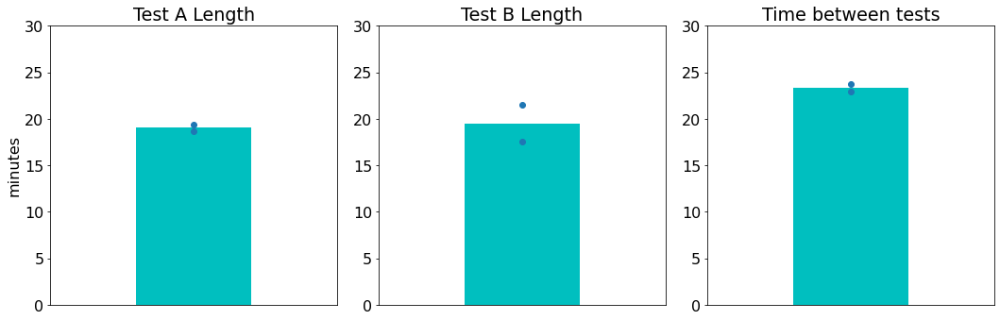

In [16]:
#Loop through all subejcts
all_td, a_len, b_len = [], [], []
for name, test in grp_subjs:
    
    #Index the different tests
    test_a = test[test.Test=='a']
    test_b = test[test.Test=='b']
    
    #calculate the length of each test
    a_len = np.append(a_len, test_a.TestLen[0]/60)
    b_len = np.append(b_len, test_b.TestLen[0]/60)

    #Calculate difference between tests and save
    test_a_end = test_a.StartTime[0] + timedelta(seconds=test_a.TestLen[0])
    time_diff = test_b.StartTime[0] - test_a_end
    all_td = np.append(all_td, time_diff.seconds/60)

#Plot
fig, ax = plt.subplots(1,3,figsize=(15,5),tight_layout=True)
ax[0].bar(0,np.mean(a_len),color='c')
ax[0].plot(np.zeros_like(a_len),a_len,'o')
ax[0].set(xlim=(-1,1), ylim=(0,30), ylabel='minutes', title='Test A Length',xticks=[])

ax[1].bar(0,np.mean(b_len),color='c')
ax[1].plot(np.zeros_like(a_len),b_len,'o')
ax[1].set(xlim=(-1,1), ylim=(0,30), title='Test B Length',xticks=[])

ax[2].bar(0,np.mean(all_td),color='c')
ax[2].plot(np.zeros_like(a_len),all_td,'o')
ax[2].set(xlim=(-1,1), ylim=(0,30), title='Time between tests',xticks=[])
plt.show()

## Are the pre-set simtuli appropriately distributed? DF

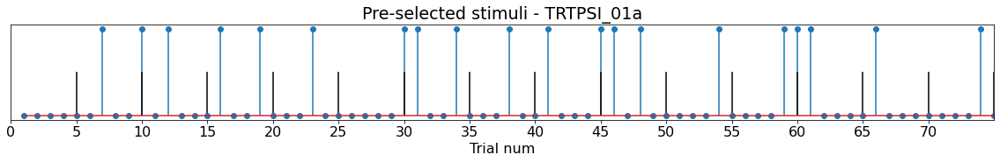

Largest difference between pre-selected stim =  8


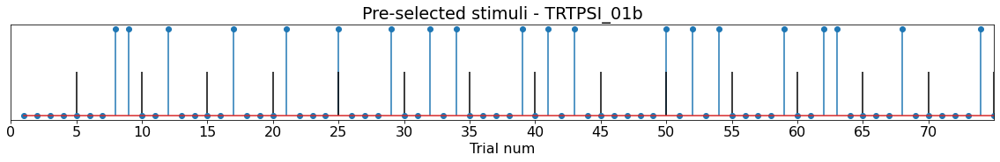

Largest difference between pre-selected stim =  7


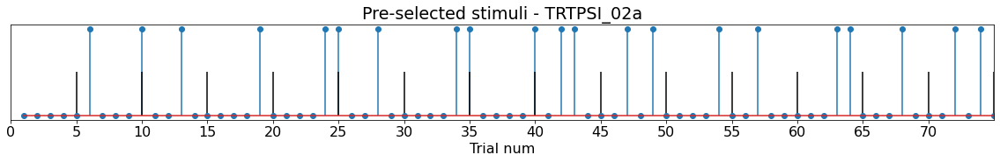

Largest difference between pre-selected stim =  6


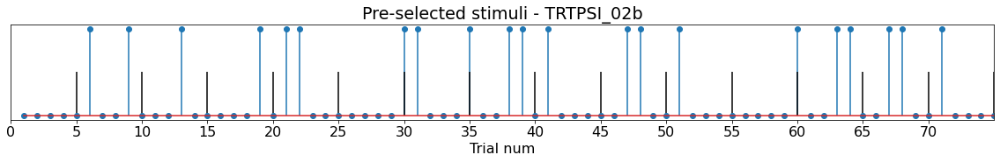

Largest difference between pre-selected stim =  9


In [17]:
for name, test in grp_tests:
    
    if test.SelectedStims.isna()[0]:
        continue
        
    #Plot 
    fig, ax = plt.subplots(figsize=(20,2))
    ax.stem(test.Trial_num,test.SelectedStims)
    ax.vlines(x=[test.Trial_num.values[4::5]],ymin=0,ymax=0.5,color='k')
    ax.set(xlim=(1,75), yticks=[], xticks=np.arange(0,75,5),title='Pre-selected stimuli - '+name[0]+name[1],xlabel='Trial num')
    plt.show()
    
    #Find the max difference between pre-selected stims
    max_diff = np.max(np.diff(test.Trial_num[test.SelectedStims==1]))
    print('Largest difference between pre-selected stim = ', max_diff) 


## Plot start positions

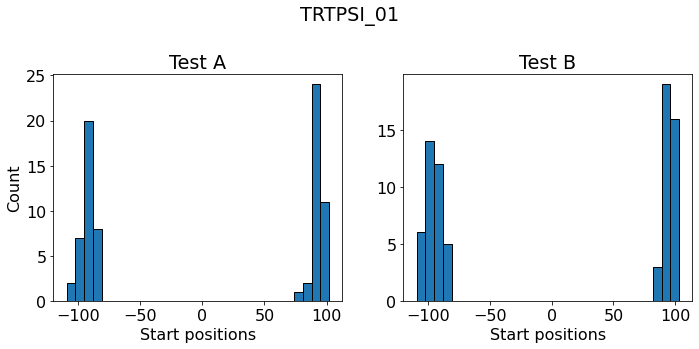

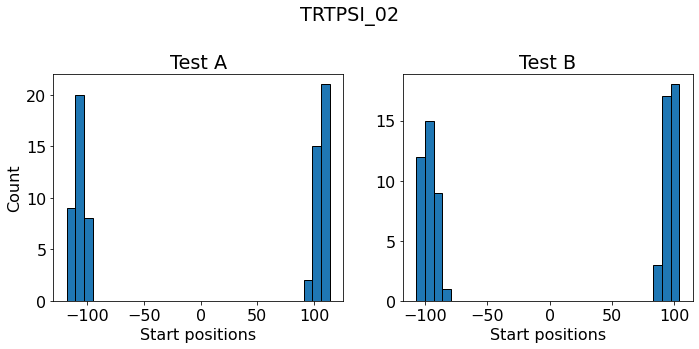

In [18]:
#Loop through all subejcts
for name, test in grp_subjs:
    
    #Index the different tests
    Test_a = test[test.Test=='a']
    Test_b = test[test.Test=='b']
    
    #Plot
    fig, ax = plt.subplots(1,2, figsize=(10,5),tight_layout=True)
    ax[0].hist(Test_a.AllStarts,edgecolor='black',bins=30)
    ax[0].set(ylabel='Count', xlabel='Start positions', title='Test A')
    ax[1].hist(Test_b.AllStarts,edgecolor='black',bins=30)
    ax[1].set(xlabel='Start positions', title='Test B')    
    fig.suptitle(name) 
    plt.show()    

# Parimary Analysis 

## Plot test 1 vs test 2

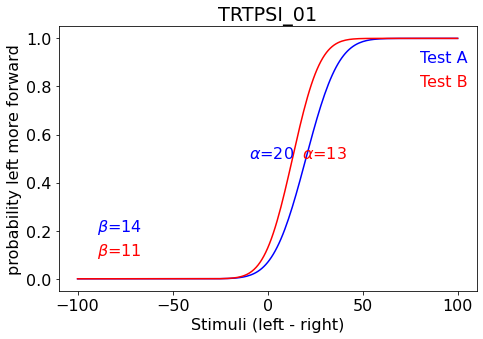

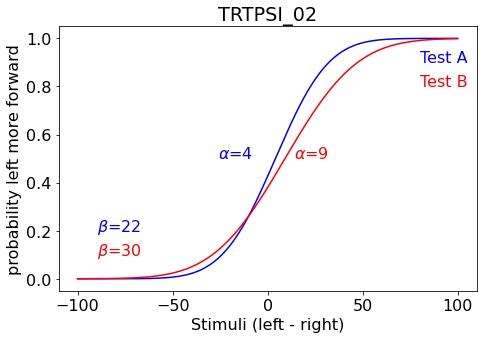

In [19]:
x = np.arange(-100,101)
#Loop through all subejcts
for name, test in grp_subjs:
    
    #Index the different tests
    Test_a = test[test.Test=='a']
    Test_b = test[test.Test=='b']
    
    #Calculate psychometric function for the PSI algorithm
    psi_a = norm.cdf(x,Test_a.Alpha_EV.values[-1]+Test_a.BslDiff.values[0],Test_a.Beta_EV.values[-1])
    psi_b = norm.cdf(x,Test_b.Alpha_EV.values[-1]+Test_b.BslDiff.values[0],Test_b.Beta_EV.values[-1])
    
    #Plot
    fig, ax = plt.subplots(figsize=(7,5),tight_layout=True)
    ax.plot(x, psi_a, 'b')
    ax.text(80,0.9,'Test A', c='b')
    ax.text(Test_a.Alpha_EV.values[-1]+Test_a.BslDiff.values[0]-30, 0.5, r'$\alpha$=' + str(round(Test_a.Alpha_EV.values[-1]+Test_a.BslDiff.values[0])), c='b')
    ax.text(-90, 0.2, r'$\beta$=' + str(round(Test_a.Beta_EV.values[-1])), c='b')
    ax.plot(x, psi_b, 'r', label='Test B')
    ax.text(80,0.8,'Test B', c='r')
    ax.text(Test_b.Alpha_EV.values[-1]+Test_b.BslDiff.values[0]+5, 0.5, r'$\alpha$=' + str(round(Test_b.Alpha_EV.values[-1]+Test_b.BslDiff.values[0])), c='r')
    ax.text(-90, 0.1, r'$\beta$=' + str(round(Test_b.Beta_EV.values[-1])), c='r')    
    ax.set(ylabel='probability left more forward', xlabel='Stimuli (left - right)', title=name)
    plt.show()    

## Test A vs Test B

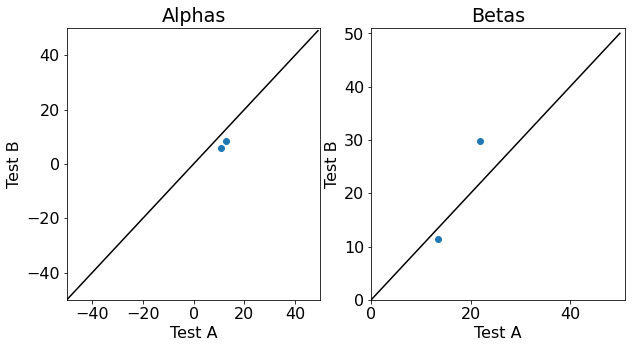

In [20]:
unique_tests = ['a','b']
alphas, betas = np.empty((len(grp_subjs),2)), np.empty((len(grp_subjs),2))
#Extract the final estimates of the alpha and beta values
for subj_name_idx, (name, test) in enumerate(grp_subjs):
    for test_id_idx, test_id in enumerate(unique_tests):
        alphas[subj_name_idx, test_id_idx] = test[test.Test==test_id].Alpha_EV.values[-1]
        betas[subj_name_idx, test_id_idx] = test[test.Test==test_id].Beta_EV.values[-1]
        
#Plot
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(alphas[:,0], alphas[:,1],'o')
ax[0].plot(np.arange(-50,50), np.arange(-50,50),'k')
ax[0].set(xlim=(-50,50), ylim=(-50,50), title='Alphas', xlabel='Test A', ylabel='Test B')
ax[1].plot(betas[:,0], betas[:,1],'o')
ax[1].plot(np.arange(0,51), np.arange(0,51),'k')
ax[1].set(xlim=(0,51), ylim=(0,51), title='Betas', xlabel='Test A', ylabel='Test B')
plt.show()

# Secondary Analysis

## Plot the data for each test along with the psi function estimated and fit post-hoc

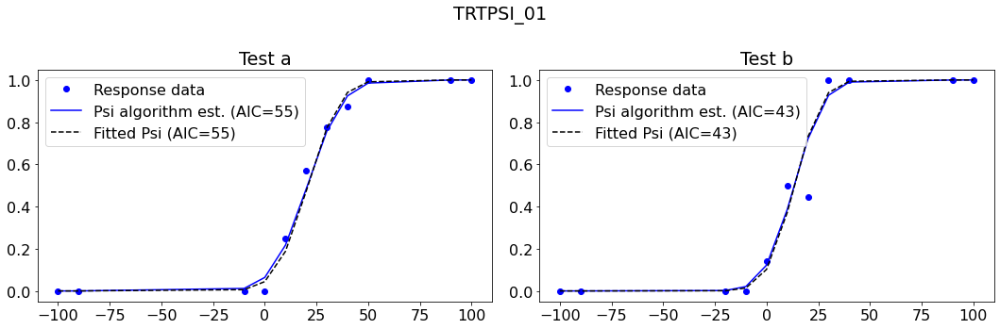

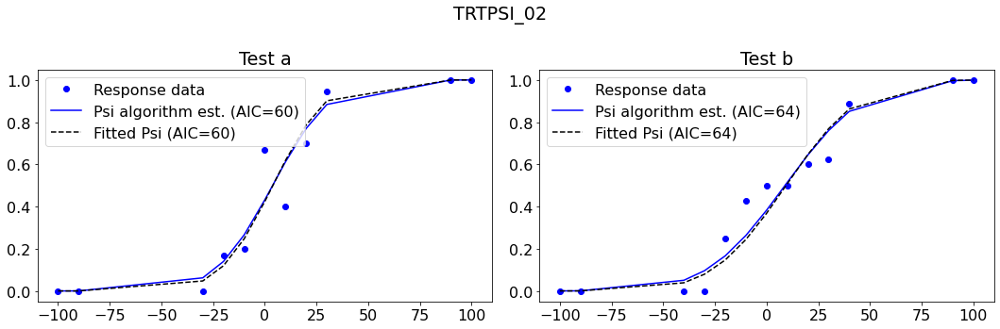

In [21]:
unique_tests = ['a','b']
AIC_diff = []
fit_alphas, fit_betas = np.empty((len(grp_subjs),len(unique_tests))), np.empty((len(grp_subjs),len(unique_tests)))
for subj_name_idx, (name, test) in enumerate(grp_subjs):
    
    fig, ax = plt.subplots(1,2,figsize=(15,5),tight_layout=True)
    for test_id_idx, test_id in enumerate(unique_tests):
        
        #Index the test
        current_test = test[test.Test==test_id]

        #index all the stim positions and baseline correct
        BslDiff = round(current_test.BslDiff.values[0])
        x, Nstims, Kleft = UniqueVals(current_test.AllStims.values+BslDiff, current_test.BinaryResponses.values)

        #Calculate psychometric function for the PSI algorithm
        psi_est = norm.cdf(x,current_test.Alpha_EV.values[-1]+BslDiff,current_test.Beta_EV.values[-1])

        #Use MLE to fit all trials 
        best_params, best_ll = Fit_psi(current_test.AllStims.values+BslDiff, current_test.BinaryResponses.values, 30)

        #Calcualte the function and save the parameters
        psi_fit = norm.cdf(x, best_params[0], best_params[1])
        fit_alphas[subj_name_idx, test_id_idx] = best_params[0]
        fit_betas[subj_name_idx, test_id_idx] = best_params[1]

        #Calculate AIC for both 
        AIC_est = psiAIC([current_test.Alpha_EV.values[-1]+BslDiff,current_test.Beta_EV.values[-1]], [Nstims, Kleft, x])
        AIC_fit = psiAIC(best_params, [Nstims, Kleft, x])
        AIC_diff = np.append(AIC_diff, AIC_fit-AIC_est)

        #Plot
        ax[test_id_idx].plot(x, Kleft/Nstims, 'bo', label='Response data')
        ax[test_id_idx].plot(x, psi_est, 'b', label='Psi algorithm est. (AIC='+  str(round(AIC_est)) +')', alpha=1)
        ax[test_id_idx].plot(x, psi_fit, 'k--', label='Fitted Psi (AIC='+ str(round(AIC_fit)) +')')
        ax[test_id_idx].set(title='Test ' + test_id)
        ax[test_id_idx].legend()
        
    fig.suptitle(name) 
    plt.show()

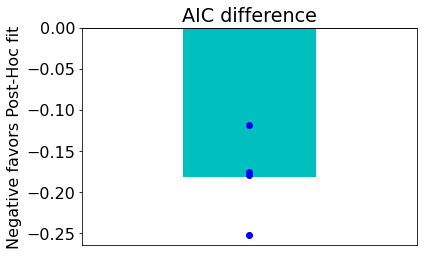

0 tests were fit better by the psi compared to post-hoc
4 tests were fit better by the post-hoc compared to the PSI
0 tests were fit the same


In [22]:
#Plot AIC difference
fig, ax = plt.subplots()
ax.bar(0,np.nanmean(AIC_diff),color='c')
ax.plot(np.zeros_like(AIC_diff),AIC_diff,'bo')
ax.plot(np.arange(-1,2),np.zeros(3),'k')
ax.set(xticks=[], ylabel='Negative favors Post-Hoc fit', xlim=(-1,1), title='AIC difference')
plt.show()
print(np.sum(AIC_diff>0), 'tests were fit better by the psi compared to post-hoc')
print(np.sum(AIC_diff<0), 'tests were fit better by the post-hoc compared to the PSI')
print(np.sum(AIC_diff==0), 'tests were fit the same')

## Are judgements different during the different 25 trial blocks? 

# Trial by trial analysis

## Plot each trial 

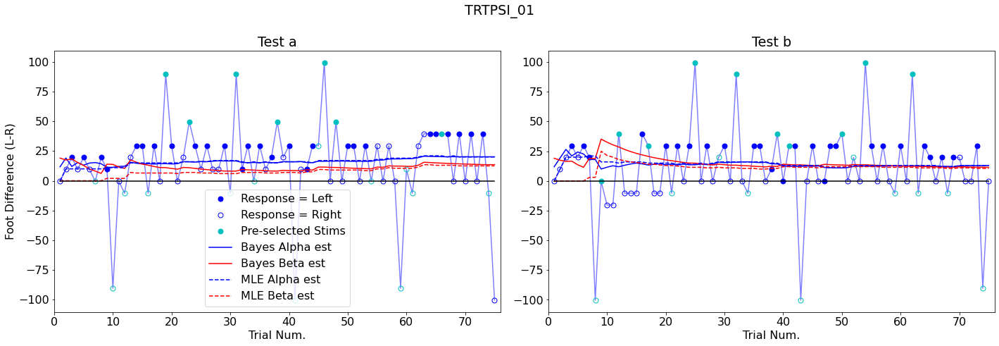

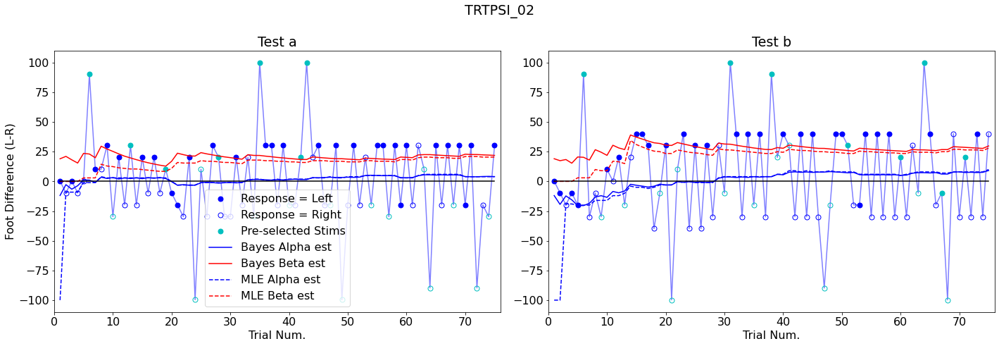

In [23]:
unique_tests = ['a','b']

for name, test in grp_subjs:
    
    fig, ax = plt.subplots(1,2,figsize=(20,7),tight_layout=True)
    for i, test_id_idx in enumerate(unique_tests):
        
        #Index the test
        current_test = test[test.Test==test_id_idx]
        
        #Index stims
        all_stims = current_test.AllStims.values+current_test.BslDiff.values
        alpha_EV = current_test.Alpha_EV.values+current_test.BslDiff.values
        responses = current_test.BinaryResponses.values

        MLE_alpha, MLE_beta = MLE_each_trial(all_stims,responses)
        
        #Plot            
        ax[i].plot(current_test.Trial_num, all_stims,'b',alpha=0.5)
        ax[i].plot(current_test.Trial_num[(current_test.SelectedStims==0) & (responses==1)], 
                   all_stims[(current_test.SelectedStims==0) & (responses==1)],'bo', markersize=7, label='Response = Left')
        ax[i].plot(current_test.Trial_num[(current_test.SelectedStims==0) & (responses==0)], 
                   all_stims[(current_test.SelectedStims==0) & (responses==0)],'bo',fillstyle='none', markersize=7, label='Response = Right')

        ax[i].plot(current_test.Trial_num[(current_test.SelectedStims==1) & (responses==1)], 
                   all_stims[(current_test.SelectedStims==1) & (responses==1)],'co', markersize=7, label='Pre-selected Stims')
        ax[i].plot(current_test.Trial_num[(current_test.SelectedStims==1) & (responses==0)], 
                   all_stims[(current_test.SelectedStims==1) & (responses==0)],'co',fillstyle='none', markersize=7)
        
        ax[i].plot(current_test.Trial_num,alpha_EV,'b-',label='Bayes Alpha est')
        ax[i].plot(current_test.Trial_num,current_test.Beta_EV,'r-',label='Bayes Beta est')
        ax[i].plot(current_test.Trial_num,MLE_alpha,'b--',label='MLE Alpha est')
        ax[i].plot(current_test.Trial_num,MLE_beta,'r--',label='MLE Beta est')
        
        ax[i].plot(current_test.Trial_num,np.zeros(len(current_test)),'k')
        ax[i].set(xlabel='Trial Num.', xlim=(0,len(current_test)+1), title='Test ' + test_id_idx)
        ax[0].set(ylabel='Foot Difference (L-R)')
        ax[0].legend()
                  
    fig.suptitle(name) 
    plt.show()

## Double check the parameter estimates

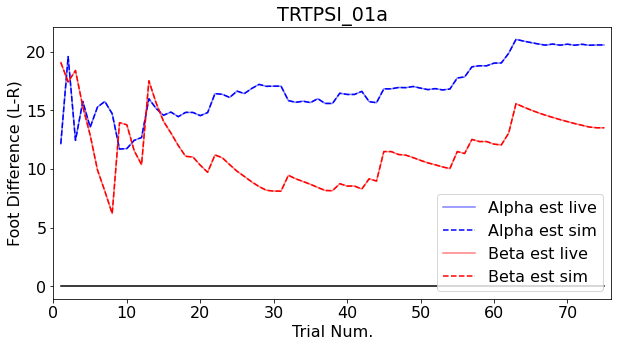

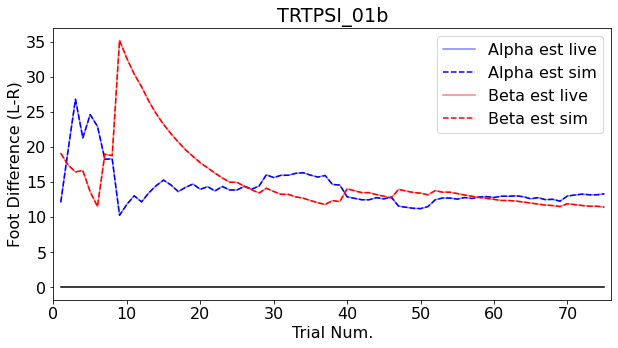

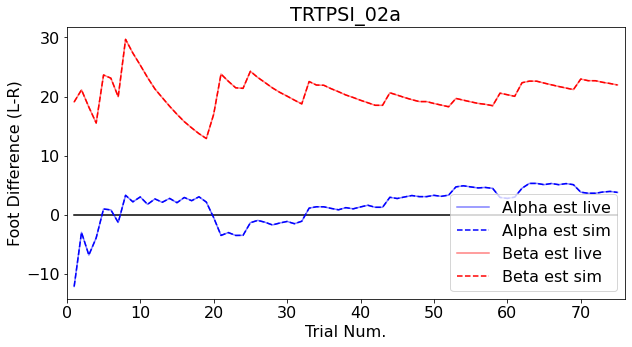

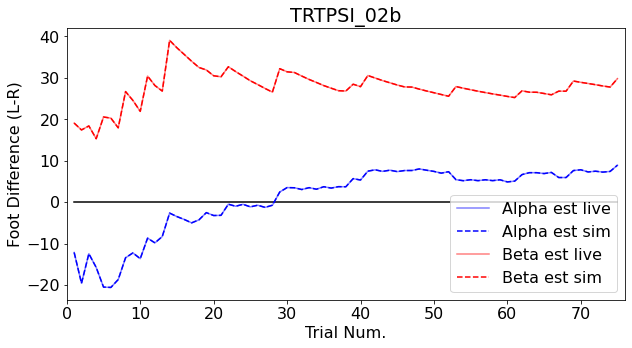

In [24]:
for name, test in grp_tests:
    check_estimates(test)

## Analize each trial

Note: this prints out a ton of figures

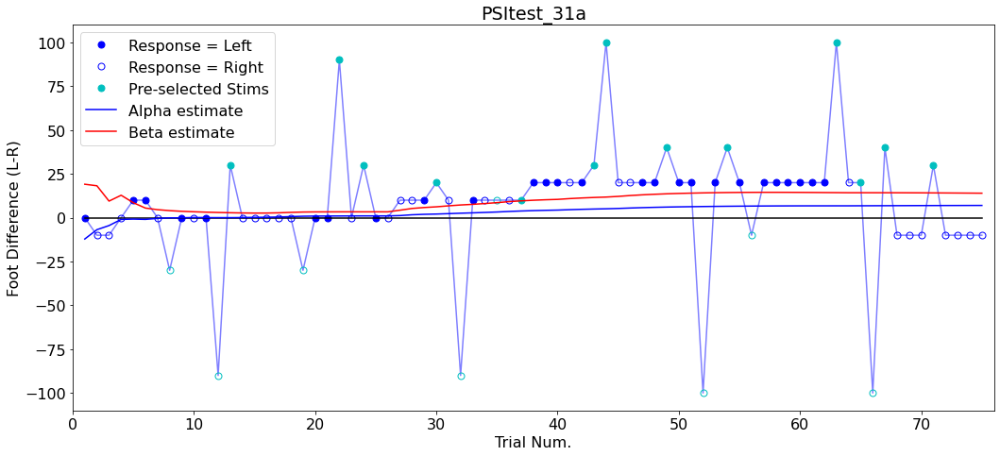

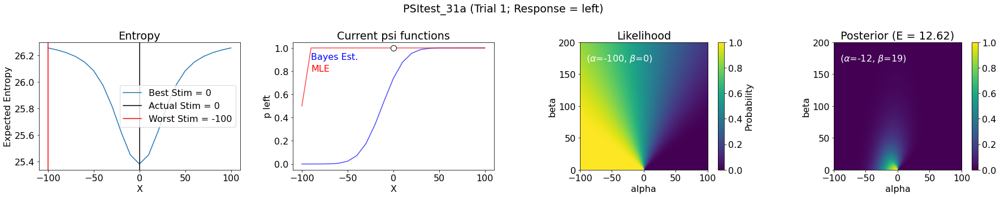

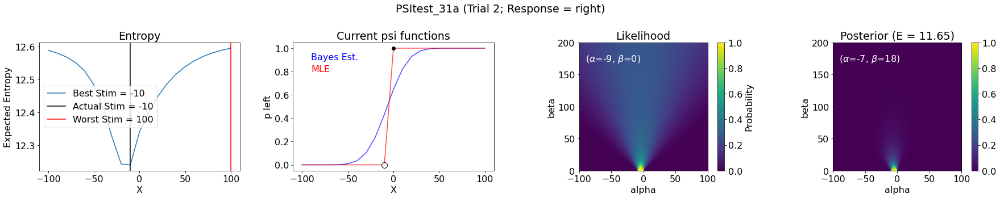

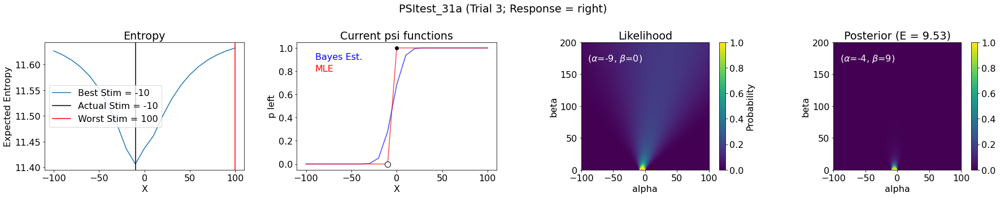

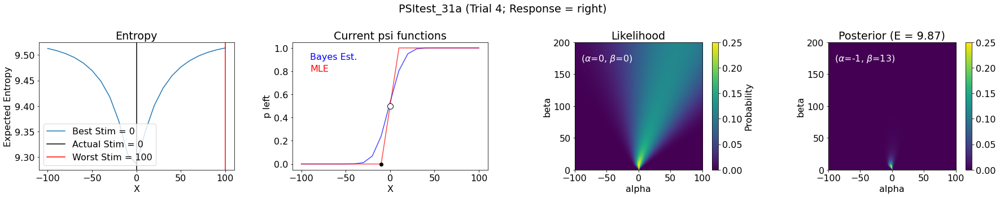

...

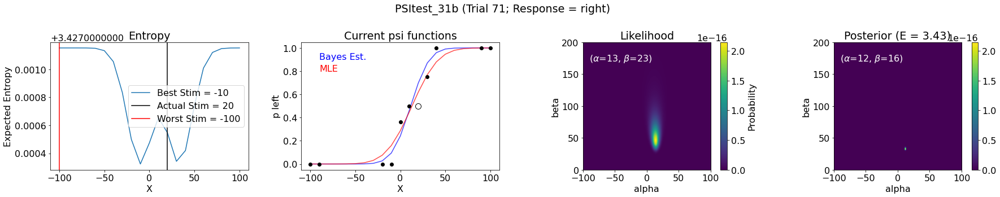

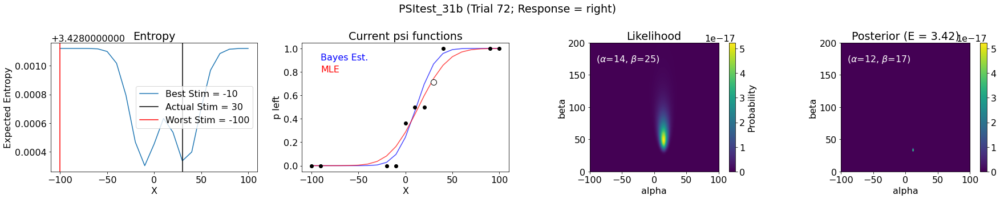

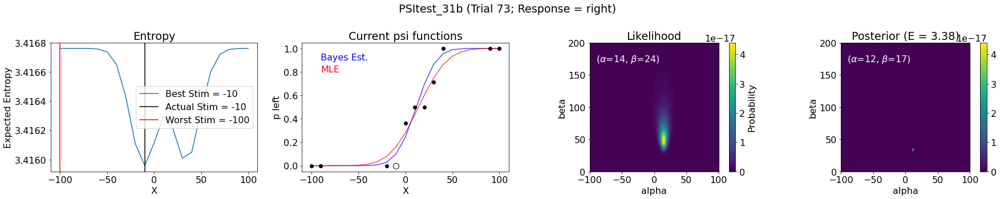

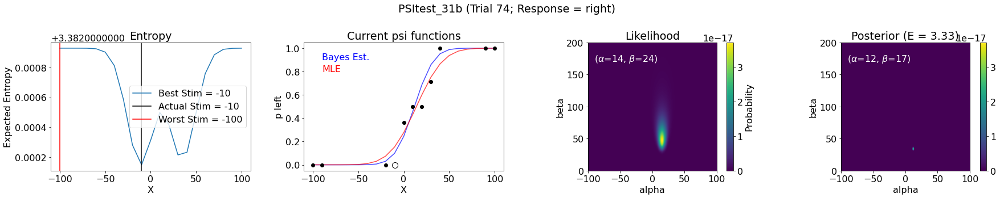

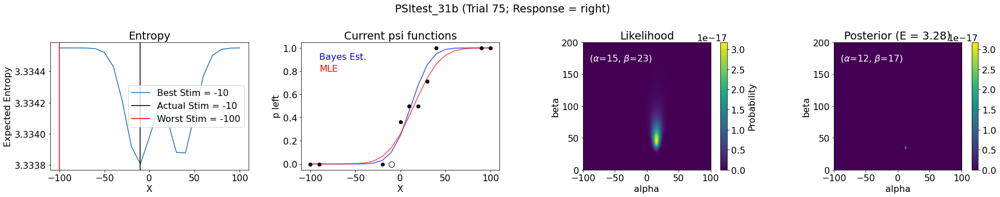

In [95]:
for name, test in grp_tests:
     ConfirmStimChoice(test, plt_entropy=False)

# Simulations

## Simulate an experiment with the parameters and compare results

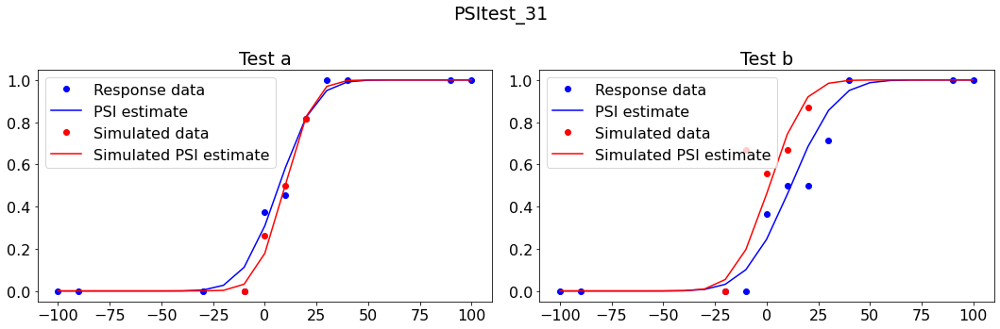

In [96]:
X = np.arange(-100,110,10)
a_range = np.linspace(-100,100,201)
b_range = np.linspace(0.001,100,201)
p_left_look, p_right_look = Psi_lookT(X,a_range,b_range)

#Set the priors
p_alpha = norm.pdf(a_range,0,20)
p_beta = expon.pdf(b_range,0,20)
p_alpha = np.reshape(p_alpha,(1,len(p_alpha)))
p_beta = np.reshape(p_beta,(1,len(p_beta)))
Prior = p_beta.T @ p_alpha

unique_tests = ['a','b']
sim_alphas, sim_betas = [], []
for subj_name_idx, (name, test) in enumerate(grp_subjs):
    fig, ax = plt.subplots(1,2,figsize=(15,5),tight_layout=True)
    for test_id_idx, test_id in enumerate(unique_tests):
        
        #Index the test
        current_test = test[test.Test==test_id]

        #Simualte
        params = [current_test.Alpha_EV.values[-1]+BslDiff, current_test.Beta_EV.values[-1]]
        stims_sim, responses_sim, alpha_EV_sim, beta_EV_sim = sim_psi(params, len(current_test), X, a_range, b_range, p_left_look, p_right_look, Prior)
        sim_alphas.append(alpha_EV_sim[-1])
        sim_betas.append(beta_EV_sim[-1])
        
        #Calculate psychometric function for the simulated PSI algorithm        
        x_sim, Nstims_sim, Kleft_sim = UniqueVals(stims_sim, responses_sim)
        psi_est_sim = norm.cdf(X, alpha_EV_sim[-1], beta_EV_sim[-1])
        
        #Calculate psychometric function for the actual PSI algorithm
        BslDiff = round(current_test.BslDiff.values[0])
        x, Nstims, Kleft = UniqueVals(current_test.AllStims.values+BslDiff, current_test.BinaryResponses.values)
        #Calculate psychometric function for the PSI algorithm
        psi_est = norm.cdf(X,current_test.Alpha_EV.values[-1]+BslDiff,current_test.Beta_EV.values[-1])

        #Plot
        ax[test_id_idx].plot(x, Kleft/Nstims, 'bo', label='Response data')
        ax[test_id_idx].plot(X, psi_est, 'b', label='PSI estimate', alpha=1)
        ax[test_id_idx].plot(x_sim, Kleft_sim/Nstims_sim, 'ro', label='Simulated data')
        ax[test_id_idx].plot(X, psi_est_sim, 'r', label='Simulated PSI estimate')
        ax[test_id_idx].set(title='Test ' + test_id)
        ax[test_id_idx].legend()
    fig.suptitle(name) 
    plt.show()

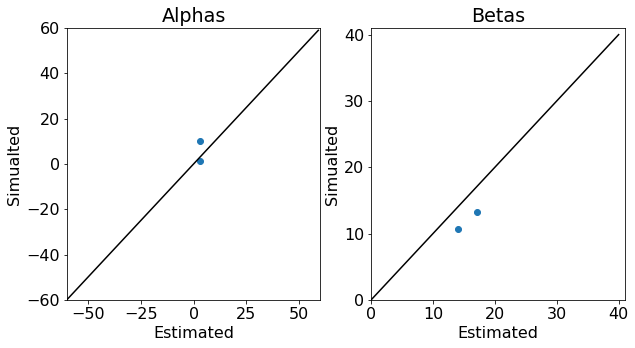

In [97]:
#Compare the simulated and actual estimates
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(np.reshape(alphas,len(alphas)*2), sim_alphas,'o')
ax[0].plot(np.arange(-60,60), np.arange(-60,60),'k')
ax[0].set(xlim=(-60,60), ylim=(-60,60), title='Alphas', xlabel='Estimated', ylabel='Simualted')
ax[1].plot(np.reshape(betas,len(alphas)*2), sim_betas,'o')
ax[1].plot(np.arange(0,41), np.arange(0,41),'k')
ax[1].set(xlim=(0,41), ylim=(0,41), title='Betas', xlabel='Estimated', ylabel='Simualted')
plt.show()

## Simulate two different posterior calculations

In [133]:
def compare_post_calcs(test):
    
    SID = test.SID[0] + test.Test[0]
    
    BslDiff = round(test.BslDiff.values[0])
    Responses = test.BinaryResponses.values
    Stims = test.AllStims.values + BslDiff

    X = np.arange(-100,110,10) 
    a_range = np.linspace(-100,100,201) 
    b_range = np.linspace(0.001,100,201)
    p_left_look, p_right_look = Psi_lookT(X, a_range, b_range)

    #Set the priors
    p_alpha = norm.pdf(a_range, 0, 20)
    p_beta = expon.pdf(b_range,0,20)
    p_alpha = np.reshape(p_alpha,(1,len(p_alpha)))
    p_beta = np.reshape(p_beta,(1,len(p_beta)))
    Prior = p_beta.T @ p_alpha 

    Prior_1 = Prior
    Prior_2 = Prior
    
    stims, responses, max_lik_alpha, max_lik_beta, alpha_EV_1, beta_EV_1, alpha_EV_2, beta_EV_2 = [], [], [], [], [], [], [], []
    for t in range(len(Responses)):
        
        #Record the stim and response
        stims = np.append(stims, Stims[t])
        responses = np.append(responses, Responses[t])

        #Account for repeated stimuli 
        Unique_stims, Nstims, Kleft = UniqueVals(stims, responses)
        current_stim_idx = np.argwhere(Unique_stims==Stims[t])

        #Calcualte the likelihood for the response given the current parameters
        Likelihood = np.empty((len(b_range),len(a_range)))
        for a_idx, a in enumerate(a_range):
            for b_idx, b in enumerate(b_range):
                psi = norm.cdf(Unique_stims,a,b)
                Likelihood[b_idx,a_idx] = np.prod((psi**Kleft) * ((1-psi)**(Nstims-Kleft)))

        #Index the max likelihood for each
        lik_max_idx = np.unravel_index(Likelihood.argmax(), Likelihood.shape)
        max_lik_alpha = a_range[lik_max_idx[1]]
        max_lik_beta = b_range[lik_max_idx[0]]

        #Calculate the posterior
        Posterior_1 = Likelihood*Prior_1                    
        Posterior_1 = Posterior_1/np.nansum(np.nansum(Posterior_1))
        #Marginalize the posterior
        alpha_post_1 = np.nansum(Posterior_1,axis=0)
        beta_post_1 = np.nansum(Posterior_1,axis=1)
        #Calculate the expected value of each
        alpha_EV_1 = np.append(alpha_EV_1, np.nansum(a_range*alpha_post_1))
        beta_EV_1 = np.append(beta_EV_1, np.nansum(b_range*beta_post_1))  

        #Alt posterior calc
        stim_idx = np.argwhere(Stims[t]==X)[0][0]
        if Responses[t]==1:
            Posterior_2 = p_left_look[:,:,stim_idx]*Prior_2
        elif Responses[t]==0:
            Posterior_2 = p_right_look[:,:,stim_idx]*Prior_2
        Posterior_2 = Posterior_2/np.nansum(np.nansum(Posterior_2))
        #Marginalize the posterior
        alpha_post_2 = np.nansum(Posterior_2,axis=0)
        beta_post_2 = np.nansum(Posterior_2,axis=1)
        #Calculate the expected value of each
        alpha_EV_2 = np.append(alpha_EV_2, np.nansum(a_range*alpha_post_2))
        beta_EV_2 = np.append(beta_EV_2, np.nansum(b_range*beta_post_2))  

        Prior_1 = Posterior_1
        Prior_2 = Posterior_2
        
    trials = test.Trial_num.values
    selected_stims = test.SelectedStims.values
    a_est = test.Alpha_EV.values + BslDiff
    b_est = test.Beta_EV.values

    fig, ax = plt.subplots(figsize=(15,7),tight_layout=True)  
    ax.plot(trials, Stims,'b',alpha=0.5)
    ax.plot(trials[(selected_stims==0) & (Responses==1)], Stims[(selected_stims==0) & (Responses==1)],'bo', markersize=7, label='Response = Left')
    ax.plot(trials[(selected_stims==0) & (Responses==0)], Stims[(selected_stims==0) & (Responses==0)],'bo',fillstyle='none', markersize=7, label='Response = Right')
    ax.plot(trials[(selected_stims==1) & (Responses==1)], Stims[(selected_stims==1) & (Responses==1)],'co', markersize=7, label='Pre-selected Stims')
    ax.plot(trials[(selected_stims==1) & (Responses==0)], Stims[(selected_stims==1) & (Responses==0)],'co',fillstyle='none', markersize=7)
    ax.plot(trials,np.zeros(len(test)),'k')
    ax.plot(trials,alpha_EV_1,'b-',label='Alpha est sim')
    ax.plot(trials,alpha_EV_2,'b--',label='Alpha est new')
    ax.plot(trials,beta_EV_1,'r-',label='Beta est sim')
    ax.plot(trials,beta_EV_2,'r--',label='Beta est new')    
    ax.set(xlabel='Trial Num.', xlim=(0,len(test)+1), title=SID,ylabel='Foot Difference (L-R)')
    ax.legend()    
    plt.show()
    
    return alpha_EV_1, alpha_EV_2, beta_EV_1, beta_EV_2

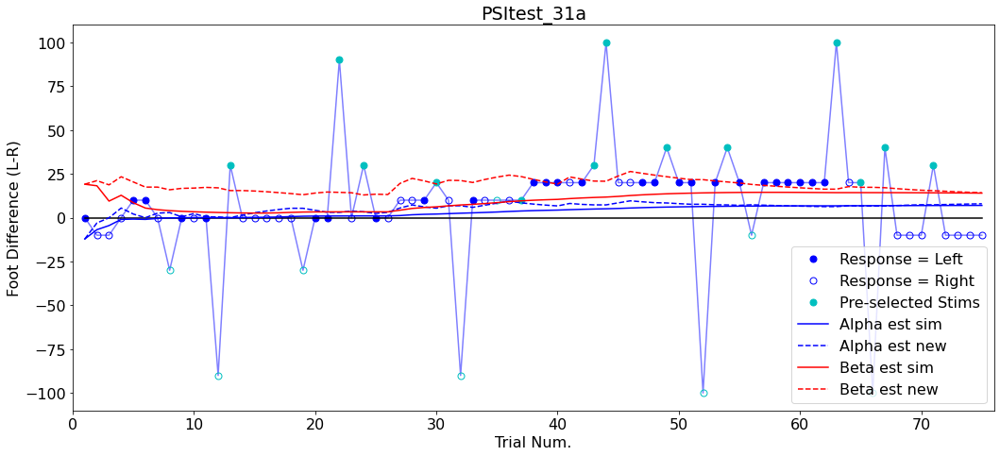

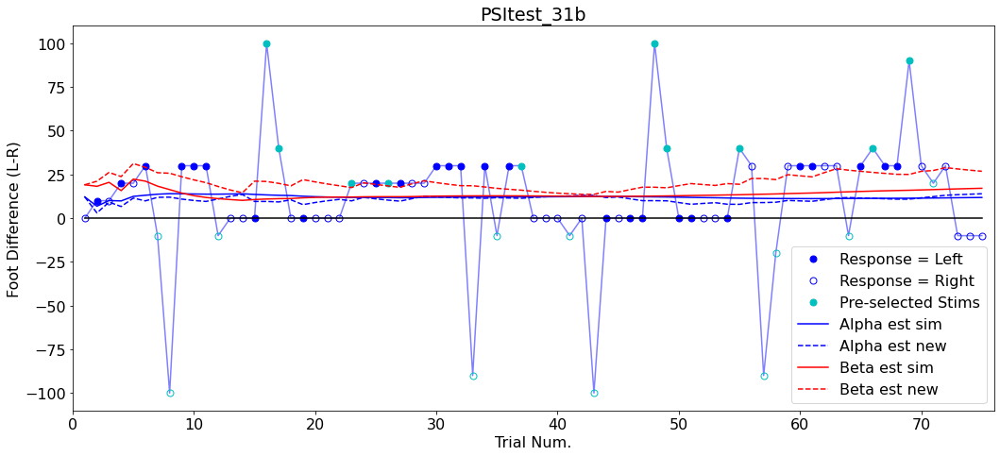

In [136]:
Aest1, Aest2, Best1, Best2 = [],[],[],[]
for name, test in grp_tests:
    alpha_EV_1, alpha_EV_2, beta_EV_1, beta_EV_2 = compare_post_calcs(test)
    Aest1 = np.append(Aest1, alpha_EV_1[-1])
    Aest2 = np.append(Aest2, alpha_EV_2[-1])
    Best1 = np.append(Best1, beta_EV_1[-1])    
    Best2 = np.append(Best2, beta_EV_2[-1]) 